In [1]:
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import numpy as np

In [2]:
def plot_globaly(plot_data,title,tcol,figfile,vmin,vmax):
    fig   = plt.figure(figsize=(15,10))
    fsize = 16
    ax    = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-100,40,-34,80])
    #ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='face', facecolor='0.5'))
    ax.coastlines()
    ax.gridlines()

    plt.pcolormesh(lon,lat,plot_data/100,transform=ccrs.PlateCarree(),vmin=vmin,vmax=vmax,cmap=cmap)
    cb = plt.colorbar(extend='both',orientation='horizontal')
    cb.ax.tick_params(labelsize=fsize)
    cb.set_label('sea level pressue anomaly (mbar)',size=fsize)
    plt.title(title,fontsize=fsize,color=tcol)
    
    plt.show()

    fig.savefig(figfile,dpi=100,bbox_inches='tight', pad_inches=0.1)

In [3]:
datadir = '/gws/nopw/j04/acsis/jmecking/CMIP6/composites/'
figdir  = '210712'

EXP          = 'piControl'
#var_ts       = 'max_lats'
var_ts       = 'max_wind'
var_field    = 'psl'
season_ts    = 'SON'
season_field = 'MAM'

infile = (datadir + EXP + '_' + var_ts + '-' + season_ts + '_' + var_field + '-' + season_field +'_std.nc' )

p_models  = ['BCC-ESM1_r1i1p1f1','CESM2-FV2_r1i1p1f1','CESM2-WACCM-FV2_r1i1p1f1','CanESM5_r1i1p1f1','CanESM5_r1i1p2f1','CanESM5-CanOE_r1i1p2f1','MIROC-ES2L_r1i1p1f2','NorCPM1_r1i1p1f1',
            'NorESM1-F_r1i1p1f1']#'CESM2-FV2_r1i1p1f1', 'NESM3_r1i1p1f1'] # Problem with these models - need to investigate!
s0_models = []
s1_models = []
s2_models = ['ACCESS-CM2_r1i1p1f1', 'CAS-ESM2-0_r1i1p1f1', 'CESM2-WACCM_r1i1p1f1','GISS-E2-1-G-CC_r1i1p1f1','GISS-E2-1-H_r1i1p1f1','GISS-E2-2-G_r1i1p1f1','HadGEM3-GC31-LL_r1i1p1f1','HadGEM3-GC31-MM_r1i1p1f1','IITM-ESM_r1i1p1f1','MIROC6_r1i1p1f1',
             'MRI-ESM2-0_r1i1p1f1','SAM0-UNICON_r1i1p1f1', 'TaiESM1_r1i1p1f1', 'UKESM1-0-LL_r1i1p1f2']
#plot_lag = 0
plot_lag = -99

In [4]:
# Read in information:

ncid   = Dataset(infile,'r')
lon    = ncid.variables['lon'][:]
lat    = ncid.variables['lat'][:]
lags   = ncid.variables['lags'][:]
models = ncid.variables['models'][:]
ncid.close()

nm = len(models)
nl = np.size(lags)

In [5]:
# Plot settings:
cmap  = plt.get_cmap('PuOr_r',21)
vmin  = -5*1.05
vmax  = 5*1.05
vmind = -10*1.05
vmaxd = 10*1.05

ACCESS-CM2_r1i1p1f1
ACCESS-ESM1-5_r1i1p1f1
BCC-CSM2-MR_r1i1p1f1
BCC-ESM1_r1i1p1f1
problem BCC-ESM1_r1i1p1f1
CAMS-CSM1-0_r1i1p1f1
CAS-ESM2-0_r1i1p1f1
CESM2_r1i1p1f1
CESM2-FV2_r1i1p1f1
problem CESM2-FV2_r1i1p1f1
CESM2-WACCM_r1i1p1f1
CESM2-WACCM-FV2_r1i1p1f1
problem CESM2-WACCM-FV2_r1i1p1f1
CMCC-CM2-SR5_r1i1p1f1
CanESM5_r1i1p1f1
problem CanESM5_r1i1p1f1
CanESM5_r1i1p2f1
problem CanESM5_r1i1p2f1
CanESM5-CanOE_r1i1p2f1
problem CanESM5-CanOE_r1i1p2f1
FGOALS-g3_r1i1p1f1
FIO-ESM-2-0_r1i1p1f1
GISS-E2-1-G_r1i1p1f1
GISS-E2-1-G-CC_r1i1p1f1
GISS-E2-1-H_r1i1p1f1
GISS-E2-2-G_r1i1p1f1
HadGEM3-GC31-LL_r1i1p1f1
HadGEM3-GC31-MM_r1i1p1f1
IITM-ESM_r1i1p1f1
MIROC-ES2L_r1i1p1f2
problem MIROC-ES2L_r1i1p1f2
MIROC6_r1i1p1f1
MPI-ESM-1-2-HAM_r1i1p1f1
MPI-ESM1-2-HR_r1i1p1f1
MPI-ESM1-2-LR_r1i1p1f1
MRI-ESM2-0_r1i1p1f1
NESM3_r1i1p1f1
NorCPM1_r1i1p1f1
problem NorCPM1_r1i1p1f1
NorESM1-F_r1i1p1f1
problem NorESM1-F_r1i1p1f1
NorESM2-MM_r1i1p1f1
SAM0-UNICON_r1i1p1f1
TaiESM1_r1i1p1f1
UKESM1-0-LL_r1i1p1f2
27


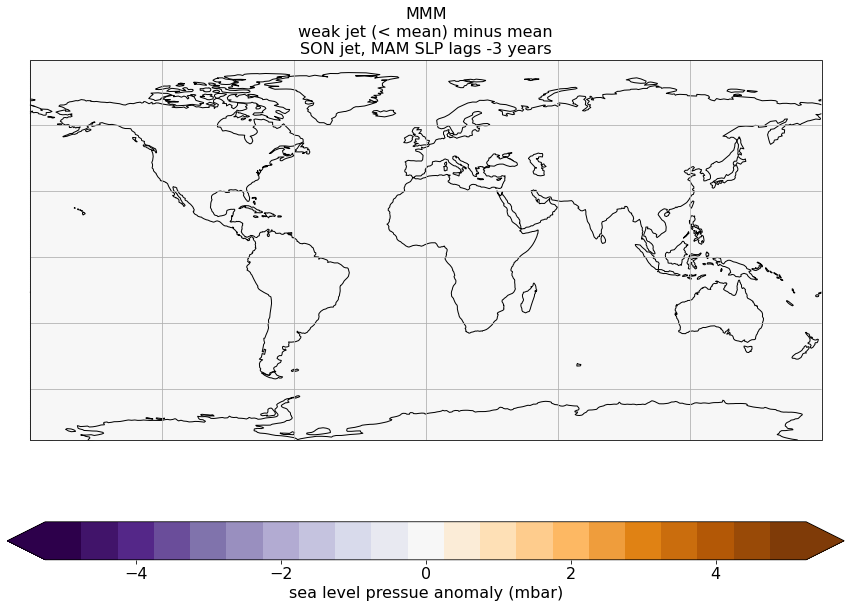

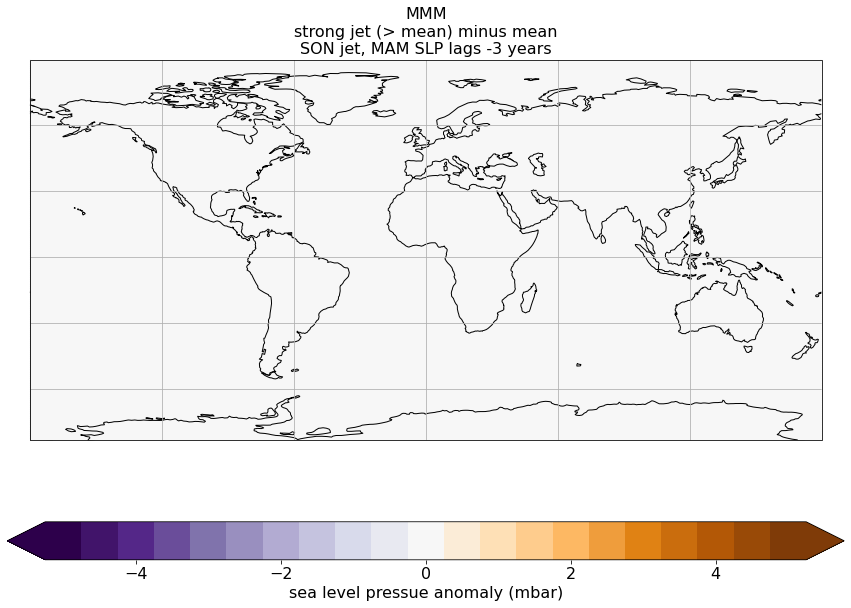

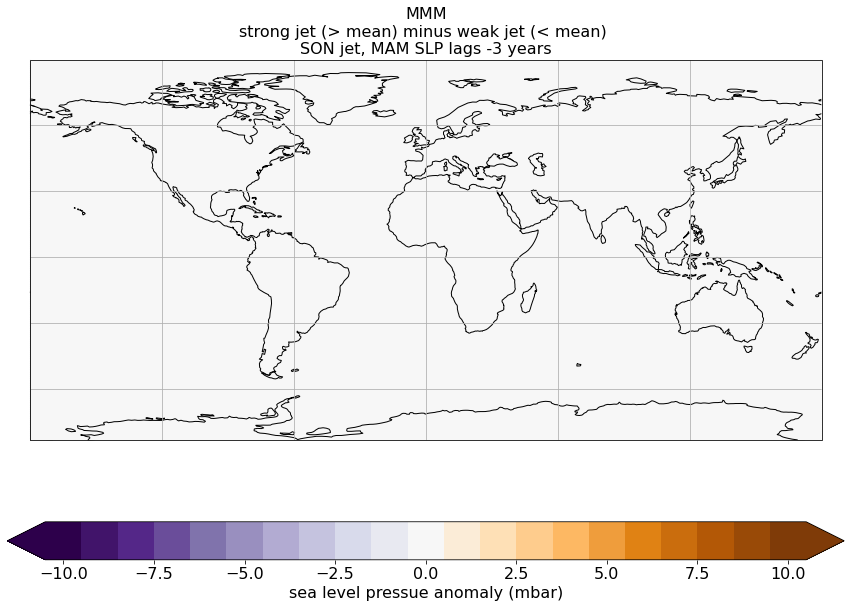

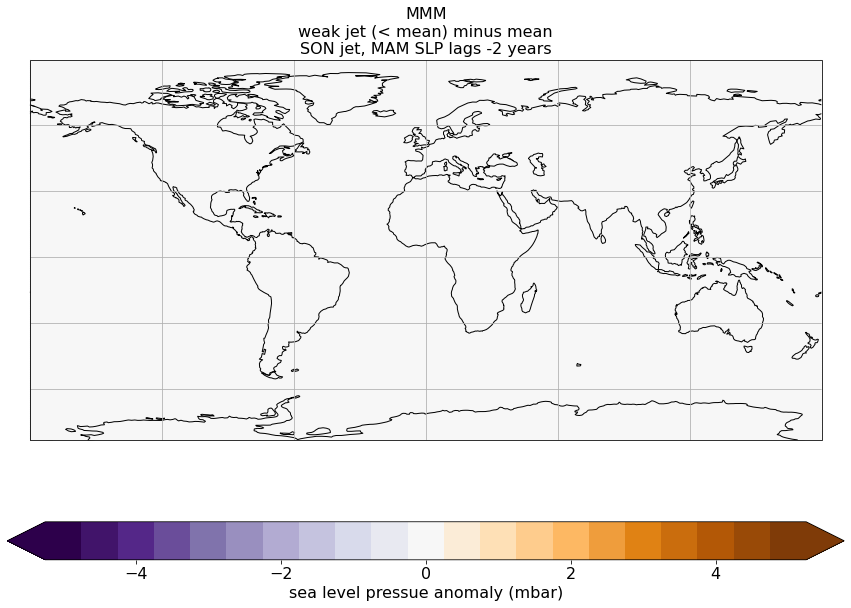

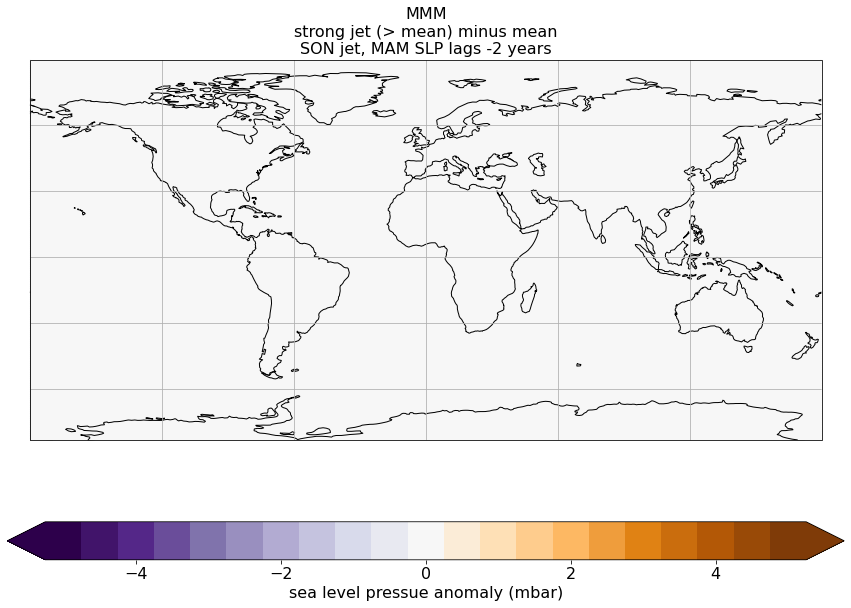

...

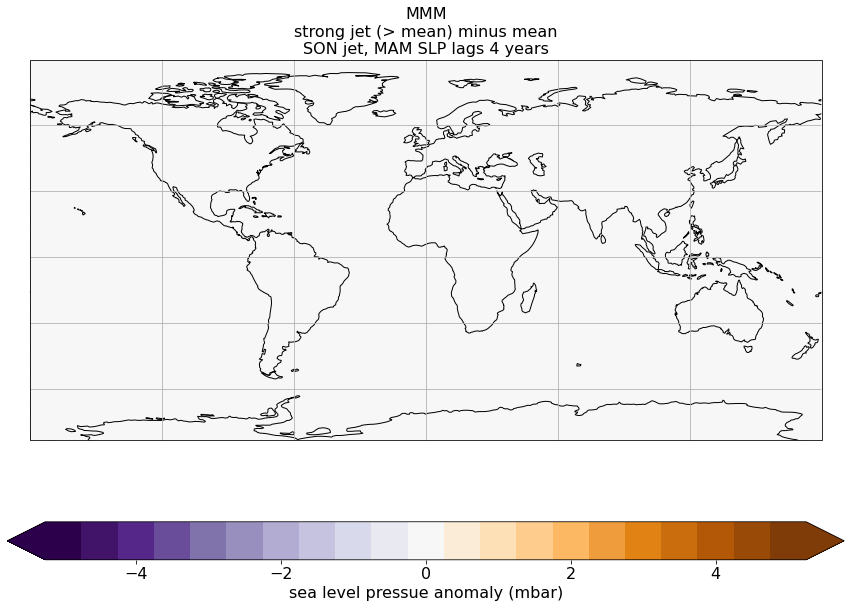

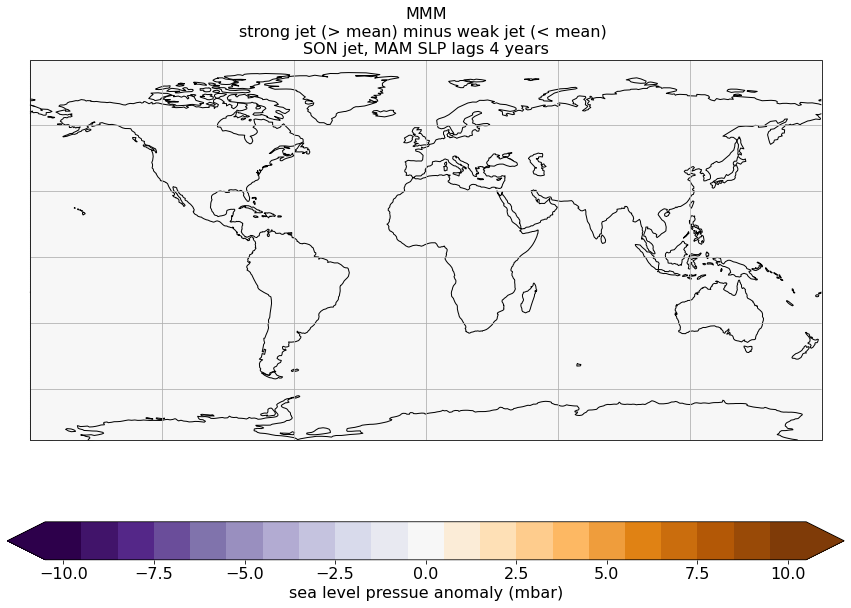

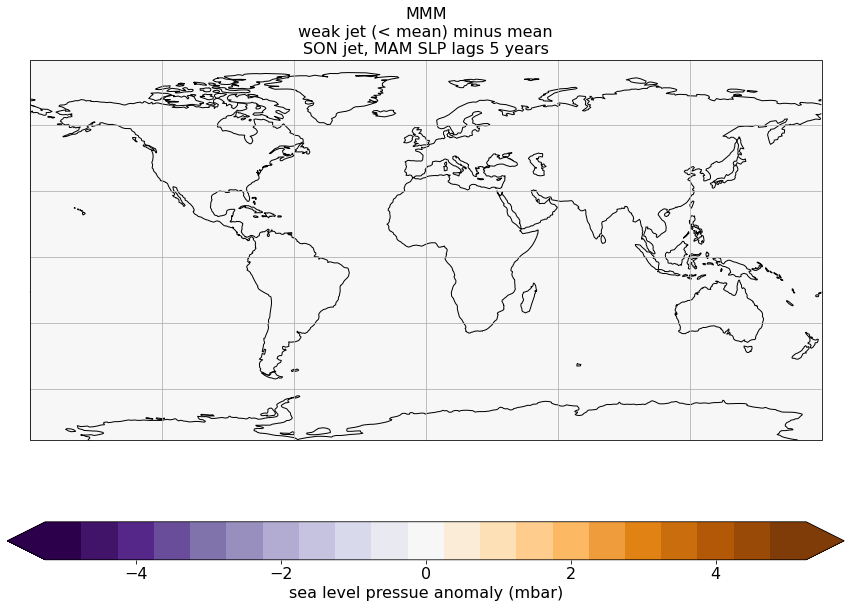

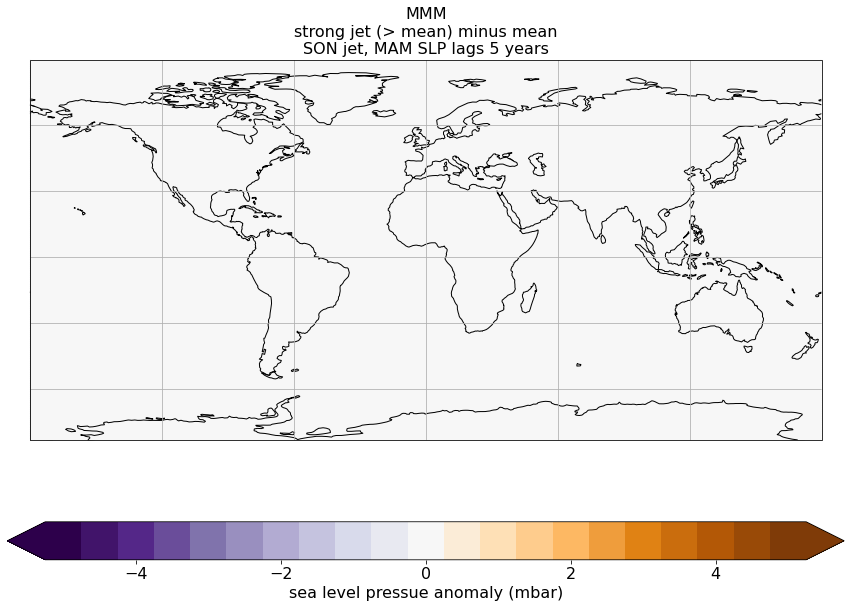

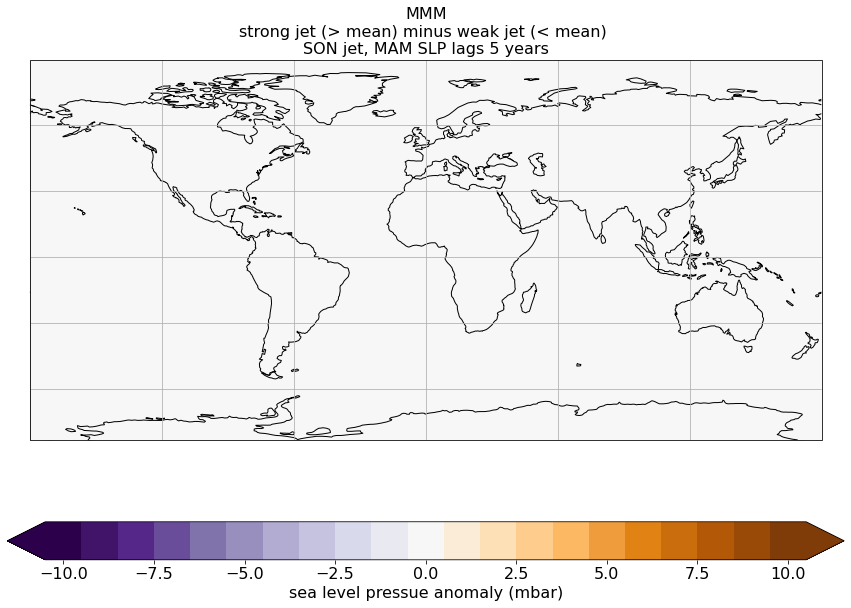

In [6]:
# Loop through each model and plot figures and save MMM:
if var_ts == 'max_lats':
    lmin  = 'southernly jet (< mean)'
    lmax  = 'northernly jet (> mean)'
elif var_ts == 'max_wind':
    lmin  = 'weak jet (< mean)'
    lmax  = 'strong jet (> mean)'

mean_MMM = np.zeros((np.size(lat),np.size(lon)),'float')
min0_MMM = np.zeros((nl,np.size(lat),np.size(lon)),'float')
max0_MMM = np.zeros((nl,np.size(lat),np.size(lon)),'float')

cc = 0
for mm in range(0,nm):
    print(models[mm])
    model = models[mm].split('_')[0]
    ENS   = models[mm].split('_')[1]
    
    ncid      = Dataset(infile,'r')
    data_mean = ncid.variables['mean'][mm,:,:]
    data_min0 = ncid.variables['min_std0'][mm,:,:,:]
    data_max0 = ncid.variables['max_std0'][mm,:,:,:]
    ncid.close()

    if models[mm] in s0_models:  # Models with too few years
        print(models[mm] + ' has no fields')
        tcol = 'C0'
    elif models[mm] in p_models:
        print('problem ' + models[mm])
        tcol = 'C3'
    else:
        tcol = 'k'
        cc = cc + 1
        mean_MMM = mean_MMM + data_mean
        min0_MMM = min0_MMM + data_min0
        max0_MMM = max0_MMM + data_max0
        
    # Plot individual models:
    for ll in range(0,nl):
        if lags[ll] == plot_lag:
            plot_globaly(data_min0[ll,:,:]-data_mean,
                         (model + ' ' + ENS + '\n' + lmin + ' minus mean\n' + season_ts +
                         ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),tcol,
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_min-mean_0std_lag' + str(int(lags[ll])) + '.png'),vmin,vmax)

            plot_globaly(data_max0[ll,:,:]-data_mean,
                         (model + ' ' + ENS + '\n' + lmax + ' minus mean\n' + season_ts +
                         ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),tcol,
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_max-mean_0std_lag' + str(int(lags[ll])) + '.png'),vmin,vmax)

            plot_globaly(data_max0[ll,:,:]-data_min0[ll,:,:],
                         (model + ' ' + ENS + '\n' + lmax + ' minus ' + lmin + '\n' + season_ts +
                         ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),tcol,
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_max-min_0std_lag' + str(int(lags[ll])) + '.png'),vmind,vmaxd)
        

mean_MMM = mean_MMM/cc
min0_MMM = min0_MMM/cc
max0_MMM = max0_MMM/cc    
print(cc) 

# Plot multi-model mean:
for ll in range(0,nl):        
    plot_globaly(min0_MMM[ll,:,:]-mean_MMM,
                 ('MMM\n' + lmin + ' minus mean\n' + season_ts +
                 ' jet, ' + season_field + ' SLP lags ' + str(int(lags[ll])) + ' years'),'k',
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_min-mean_0std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max0_MMM[ll,:,:]-mean_MMM,
                 ('MMM\n' + lmax + ' minus mean\n' + season_ts +
                 ' jet, ' + season_field + ' SLP lags ' + str(int(lags[ll])) + ' years'),'k',
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_max-mean_0std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max0_MMM[ll,:,:]-min0_MMM[ll,:,:],
                 ('MMM\n' + lmax + ' minus ' + lmin + ' \n' + season_ts +
                 ' jet, ' + season_field + ' SLP lags ' + str(int(lags[ll])) + ' years'),'k',
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                  '-' + season_field + '_max-min_0std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)

ACCESS-CM2_r1i1p1f1
ACCESS-ESM1-5_r1i1p1f1
BCC-CSM2-MR_r1i1p1f1
BCC-ESM1_r1i1p1f1
problem BCC-ESM1_r1i1p1f1
CAMS-CSM1-0_r1i1p1f1
CAS-ESM2-0_r1i1p1f1
CESM2_r1i1p1f1
CESM2-FV2_r1i1p1f1
problem CESM2-FV2_r1i1p1f1
CESM2-WACCM_r1i1p1f1
CESM2-WACCM-FV2_r1i1p1f1
problem CESM2-WACCM-FV2_r1i1p1f1
CMCC-CM2-SR5_r1i1p1f1
CanESM5_r1i1p1f1
problem CanESM5_r1i1p1f1
CanESM5_r1i1p2f1
problem CanESM5_r1i1p2f1
CanESM5-CanOE_r1i1p2f1
problem CanESM5-CanOE_r1i1p2f1
FGOALS-g3_r1i1p1f1
FIO-ESM-2-0_r1i1p1f1
GISS-E2-1-G_r1i1p1f1
GISS-E2-1-G-CC_r1i1p1f1
GISS-E2-1-H_r1i1p1f1
GISS-E2-2-G_r1i1p1f1
HadGEM3-GC31-LL_r1i1p1f1
HadGEM3-GC31-MM_r1i1p1f1
IITM-ESM_r1i1p1f1
MIROC-ES2L_r1i1p1f2
problem MIROC-ES2L_r1i1p1f2
MIROC6_r1i1p1f1
MPI-ESM-1-2-HAM_r1i1p1f1
MPI-ESM1-2-HR_r1i1p1f1
MPI-ESM1-2-LR_r1i1p1f1
MRI-ESM2-0_r1i1p1f1
NESM3_r1i1p1f1
NorCPM1_r1i1p1f1
problem NorCPM1_r1i1p1f1
NorESM1-F_r1i1p1f1
problem NorESM1-F_r1i1p1f1
NorESM2-MM_r1i1p1f1
SAM0-UNICON_r1i1p1f1
TaiESM1_r1i1p1f1
UKESM1-0-LL_r1i1p1f2
27


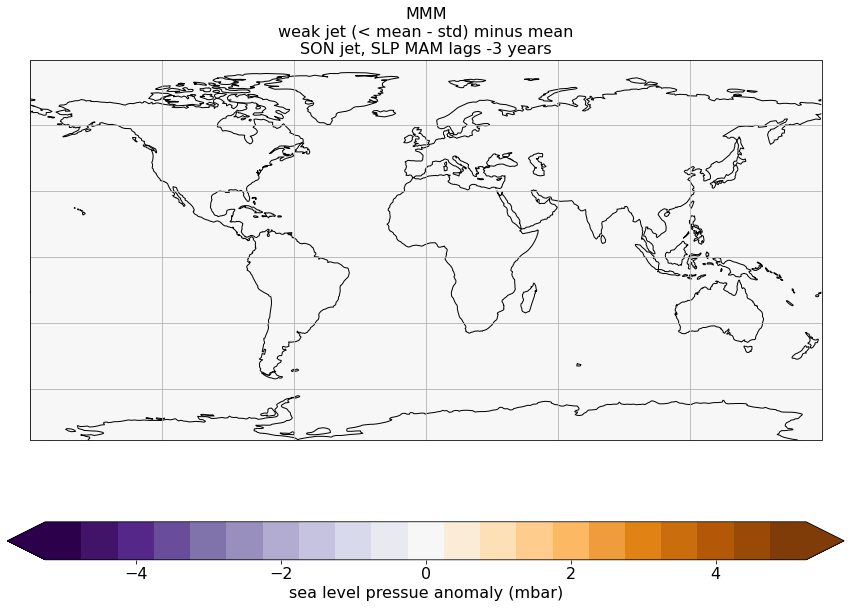

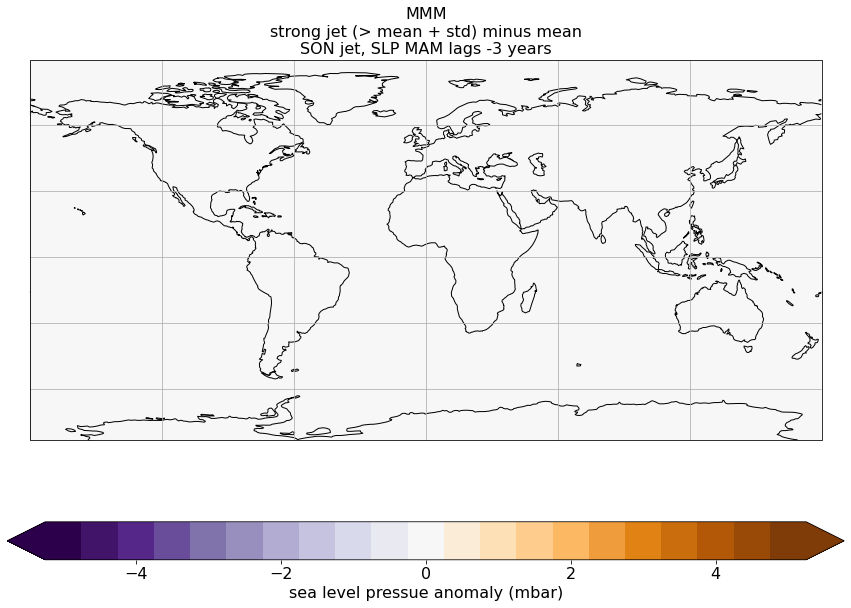

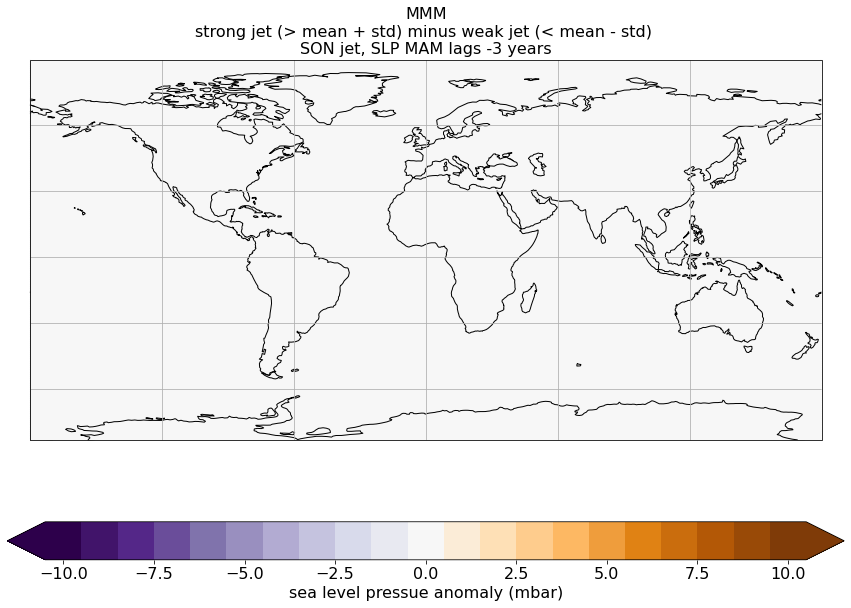

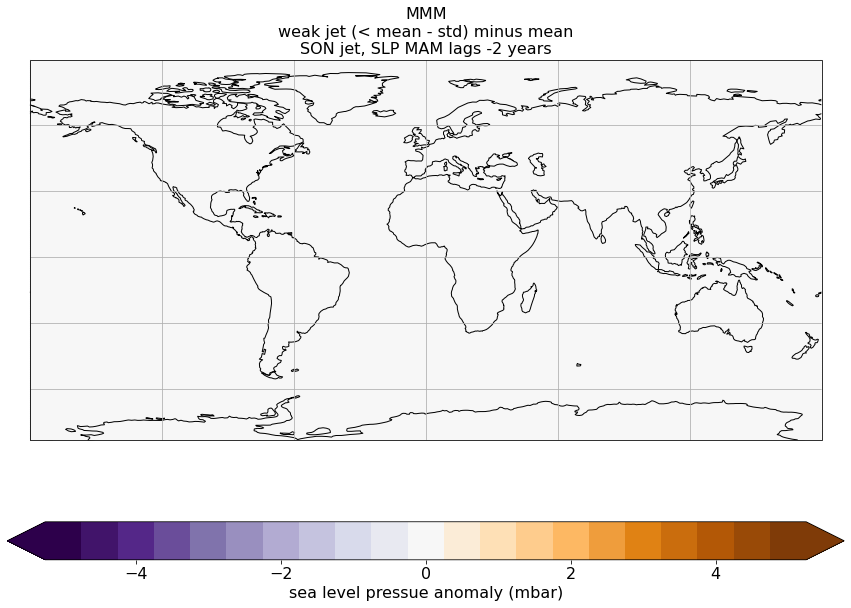

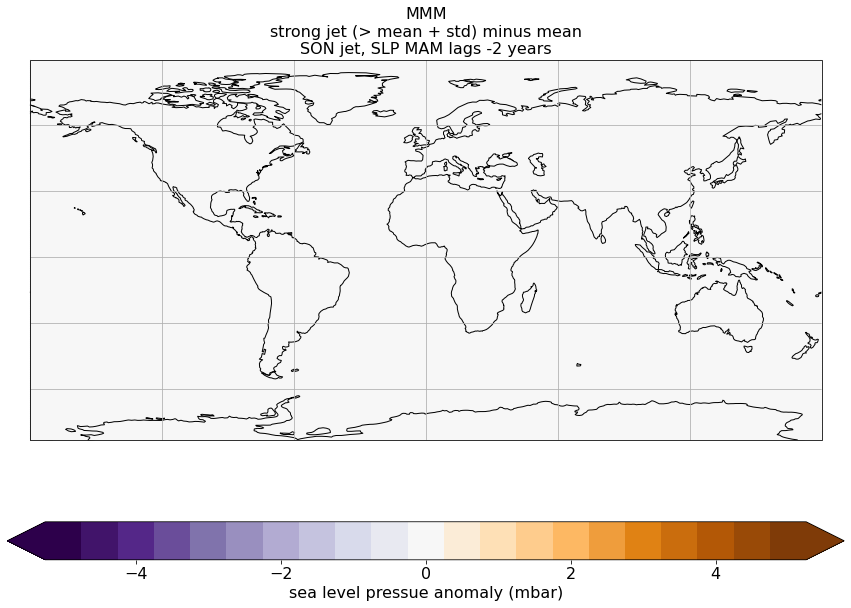

...

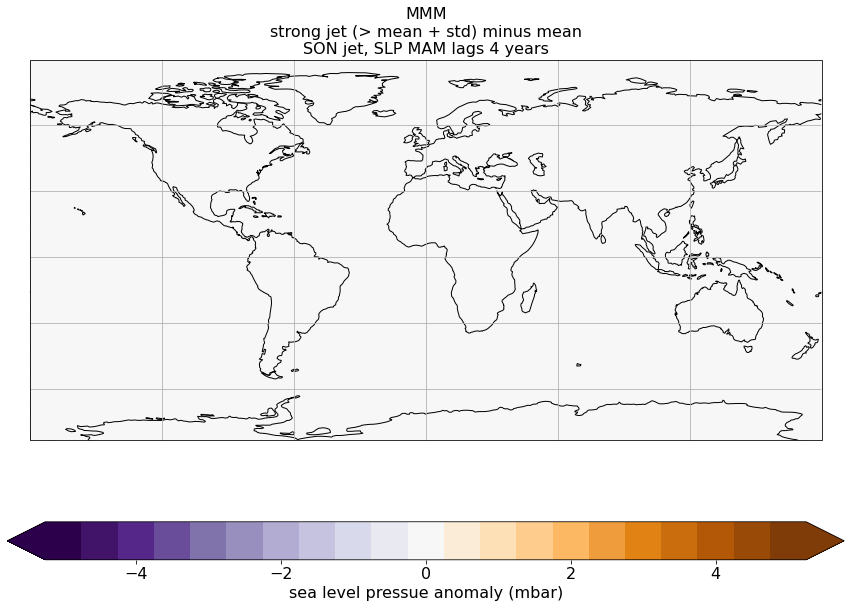

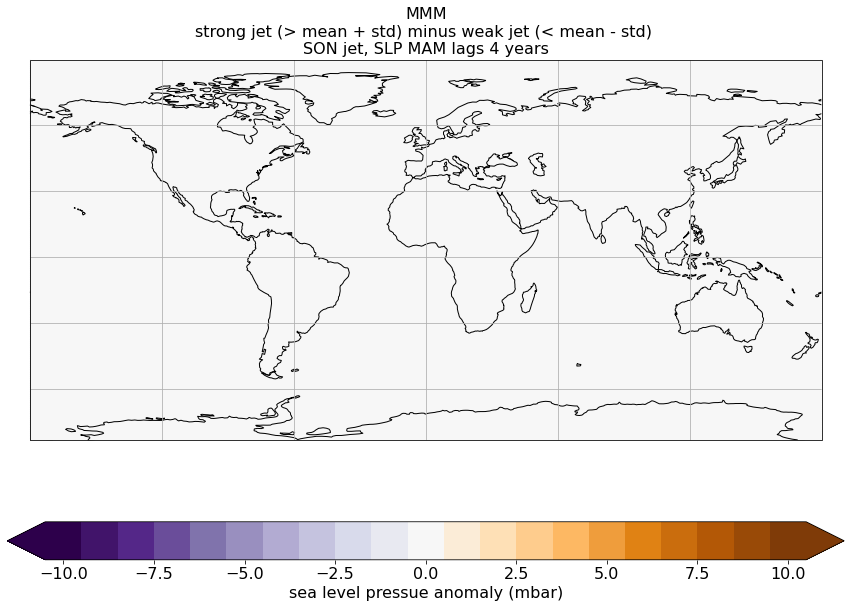

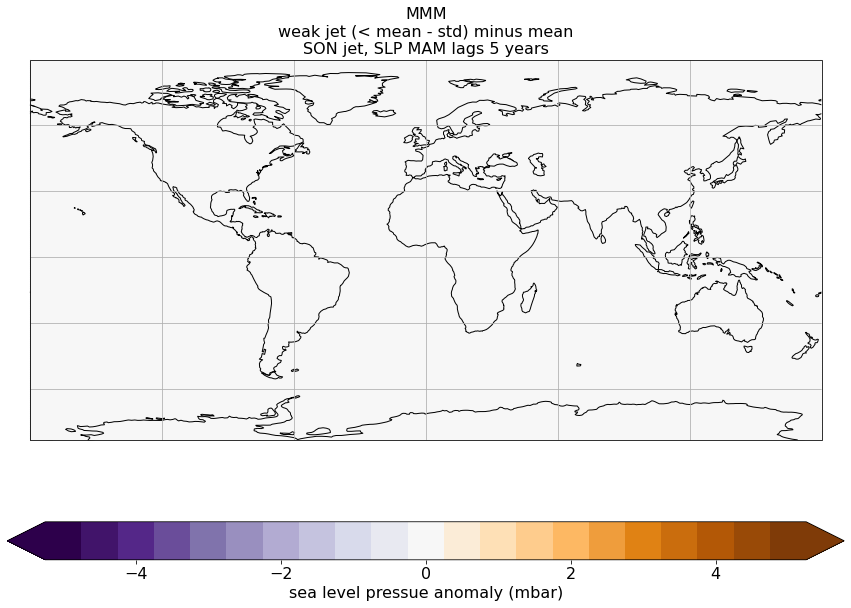

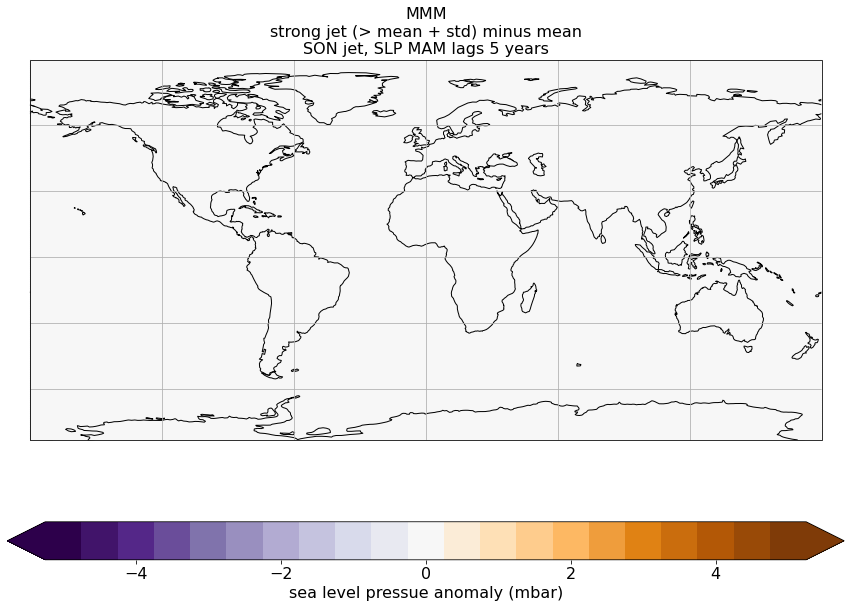

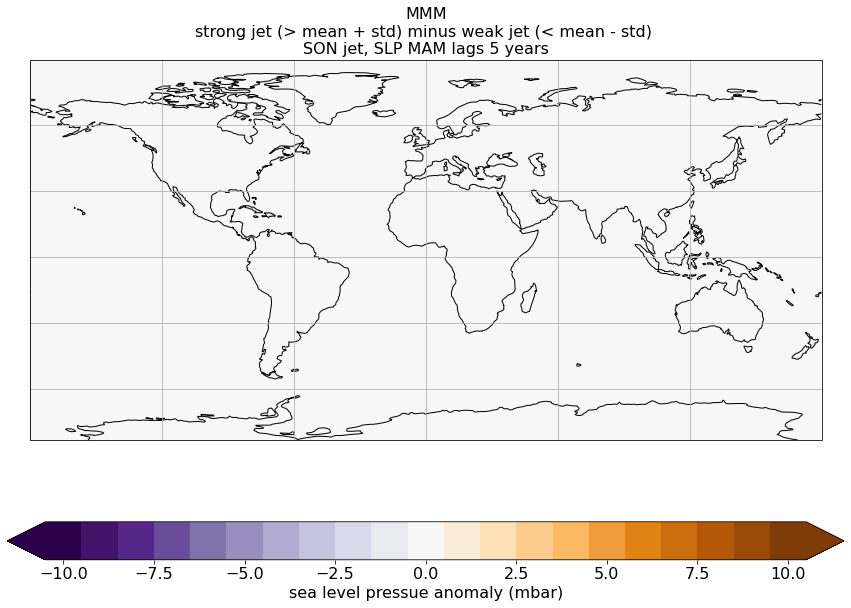

In [7]:
# Loop through each model and plot figures and save MMM:

if var_ts == 'max_lats':
    lmin  = 'southernly jet (< mean - std)'
    lmax  = 'northernly jet (> mean + std)'
elif var_ts == 'max_wind':
    lmin  = 'weak jet (< mean - std)'
    lmax  = 'strong jet (> mean + std)'

mean_MMM = np.zeros((np.size(lat),np.size(lon)),'float')
min1_MMM = np.zeros((nl,np.size(lat),np.size(lon)),'float')
max1_MMM = np.zeros((nl,np.size(lat),np.size(lon)),'float')

cc = 0
for mm in range(0,nm):
    print(models[mm])
    model = models[mm].split('_')[0]
    ENS   = models[mm].split('_')[1]
    
    ncid      = Dataset(infile,'r')
    data_mean = ncid.variables['mean'][mm,:,:]
    data_min1 = ncid.variables['min_std1'][mm,:,:,:]
    data_max1 = ncid.variables['max_std1'][mm,:,:,:]
    ncid.close()

    if models[mm] in s1_models:  # Models with too few years
        print(models[mm] + ' has no fields')
        tcol = 'C0'
    elif models[mm] in p_models:
        print('problem ' + models[mm])
        tcol = 'C3'
    else:
        tcol = 'k'
        cc = cc + 1
        mean_MMM = mean_MMM + data_mean
        min1_MMM = min1_MMM + data_min1
        max1_MMM = max1_MMM + data_max1
    # Plot individual models:
    for ll in range(0,nl):
        if lags[ll] == plot_lag:
            plot_globaly(data_min1[ll,:,:]-data_mean,
                         (model + ' ' + ENS + '\n' + lmin + ' minus mean\n' + season_ts +
                         ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),tcol,
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_min-mean_1std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

            plot_globaly(data_max1[ll,:,:]-data_mean,
                         (model + ' ' + ENS + '\n' + lmax + ' minus mean\n' + season_ts +
                         ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),tcol,
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_max-mean_1std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

            plot_globaly(data_max1[ll,:,:]-data_min1[ll,:,:],
                         (model + ' ' + ENS + '\n' + lmax + ' minus ' + lmin + '\n' + season_ts +
                         ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),tcol,
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_max-min_1std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)
        
mean_MMM = mean_MMM/cc
min1_MMM = min1_MMM/cc
max1_MMM = max1_MMM/cc  
print(cc)   

# Plot multi-model mean:
for ll in range(0,nl):        
    plot_globaly(min1_MMM[ll,:,:]-mean_MMM,
                 ('MMM\n' + lmin + ' minus mean\n' + season_ts +
                 ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),'k',
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_min-mean_1std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max1_MMM[ll,:,:]-mean_MMM,
                 ('MMM\n' + lmax + ' minus mean\n' + season_ts +
                 ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),'k',
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_max-mean_1std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max1_MMM[ll,:,:]-min1_MMM[ll,:,:],
                 ('MMM\n' + lmax + ' minus ' + lmin + ' \n' + season_ts +
                 ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),'k',
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                  '-' + season_field + '_max-min_1std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)

ACCESS-CM2_r1i1p1f1
ACCESS-CM2_r1i1p1f1 has no fields
ACCESS-ESM1-5_r1i1p1f1
BCC-CSM2-MR_r1i1p1f1
BCC-ESM1_r1i1p1f1
problem BCC-ESM1_r1i1p1f1
CAMS-CSM1-0_r1i1p1f1
CAS-ESM2-0_r1i1p1f1
CAS-ESM2-0_r1i1p1f1 has no fields
CESM2_r1i1p1f1
CESM2-FV2_r1i1p1f1
problem CESM2-FV2_r1i1p1f1
CESM2-WACCM_r1i1p1f1
CESM2-WACCM_r1i1p1f1 has no fields
CESM2-WACCM-FV2_r1i1p1f1
problem CESM2-WACCM-FV2_r1i1p1f1
CMCC-CM2-SR5_r1i1p1f1
CanESM5_r1i1p1f1
problem CanESM5_r1i1p1f1
CanESM5_r1i1p2f1
problem CanESM5_r1i1p2f1
CanESM5-CanOE_r1i1p2f1
problem CanESM5-CanOE_r1i1p2f1
FGOALS-g3_r1i1p1f1
FIO-ESM-2-0_r1i1p1f1
GISS-E2-1-G_r1i1p1f1
GISS-E2-1-G-CC_r1i1p1f1
GISS-E2-1-G-CC_r1i1p1f1 has no fields
GISS-E2-1-H_r1i1p1f1
GISS-E2-1-H_r1i1p1f1 has no fields
GISS-E2-2-G_r1i1p1f1
GISS-E2-2-G_r1i1p1f1 has no fields
HadGEM3-GC31-LL_r1i1p1f1
HadGEM3-GC31-LL_r1i1p1f1 has no fields
HadGEM3-GC31-MM_r1i1p1f1
HadGEM3-GC31-MM_r1i1p1f1 has no fields
IITM-ESM_r1i1p1f1
IITM-ESM_r1i1p1f1 has no fields
MIROC-ES2L_r1i1p1f2
problem MIROC-E

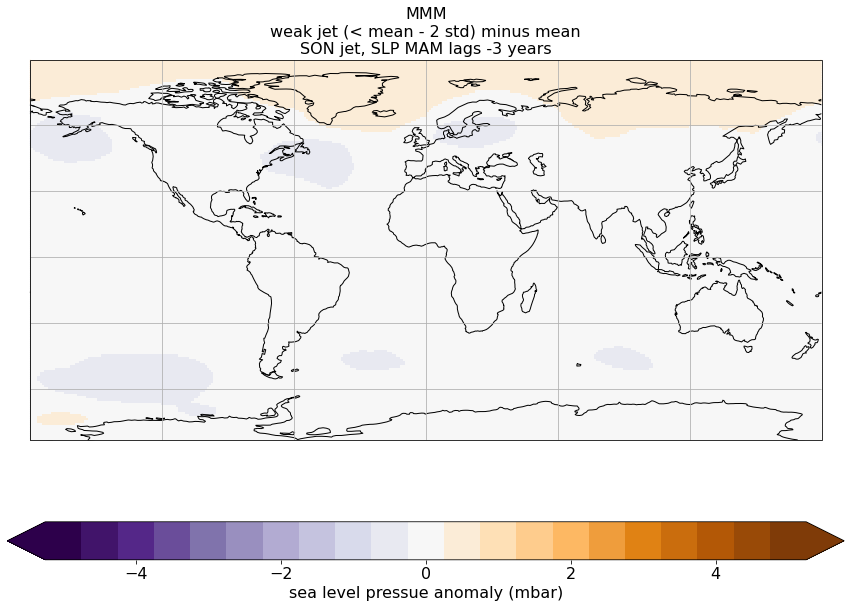

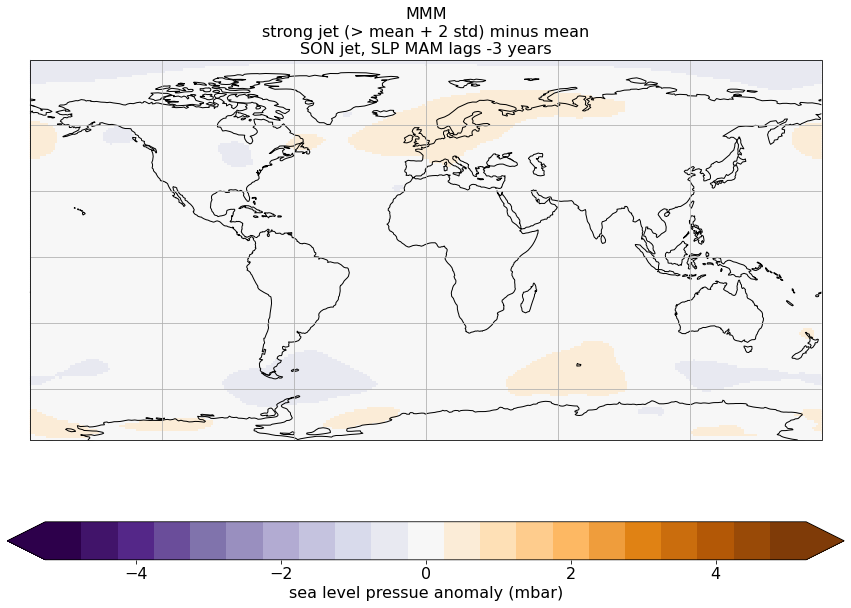

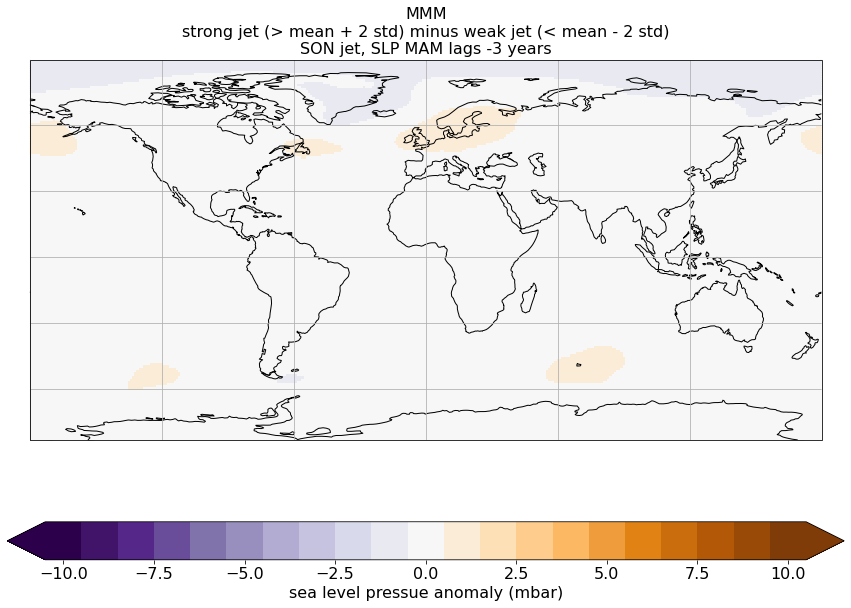

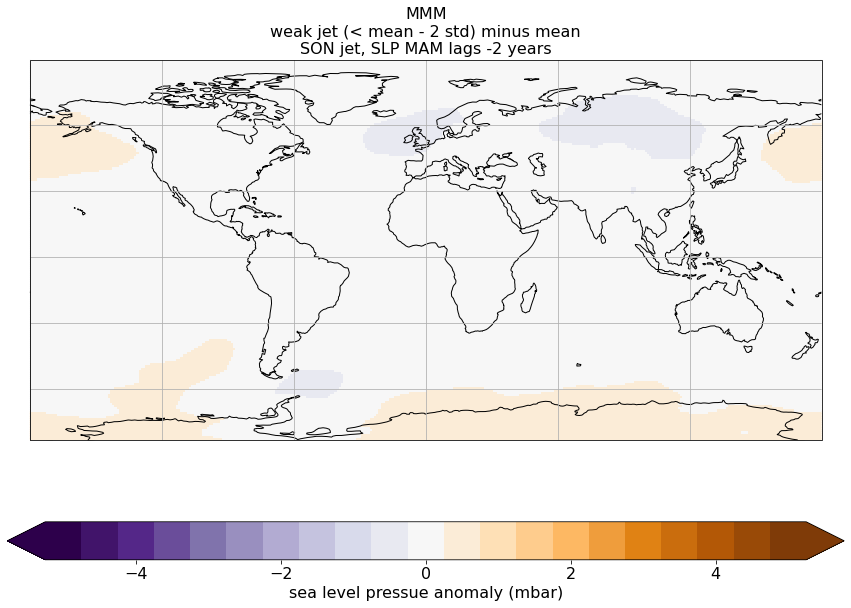

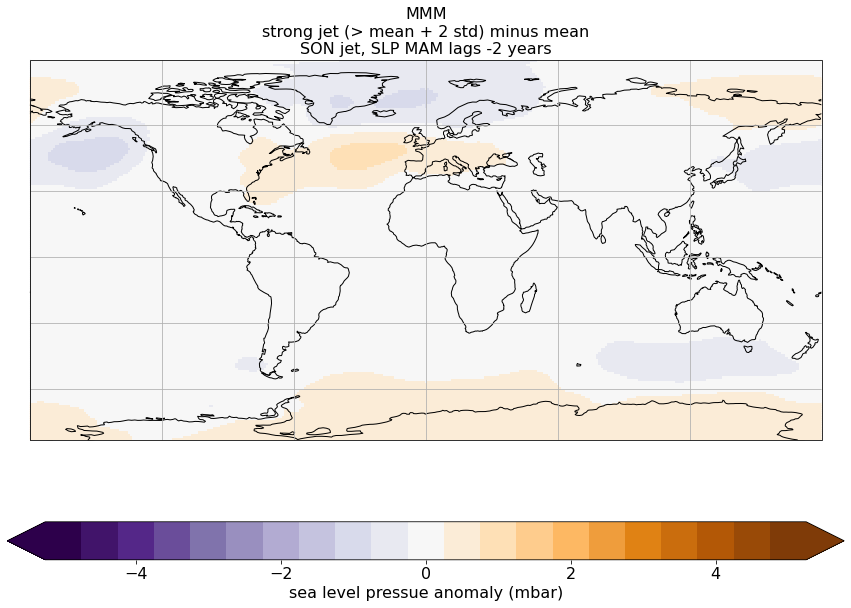

...

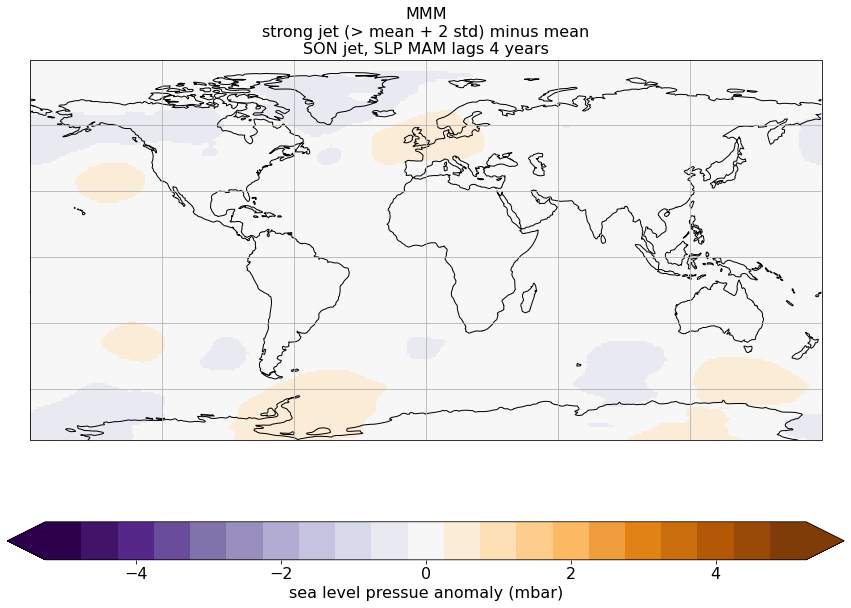

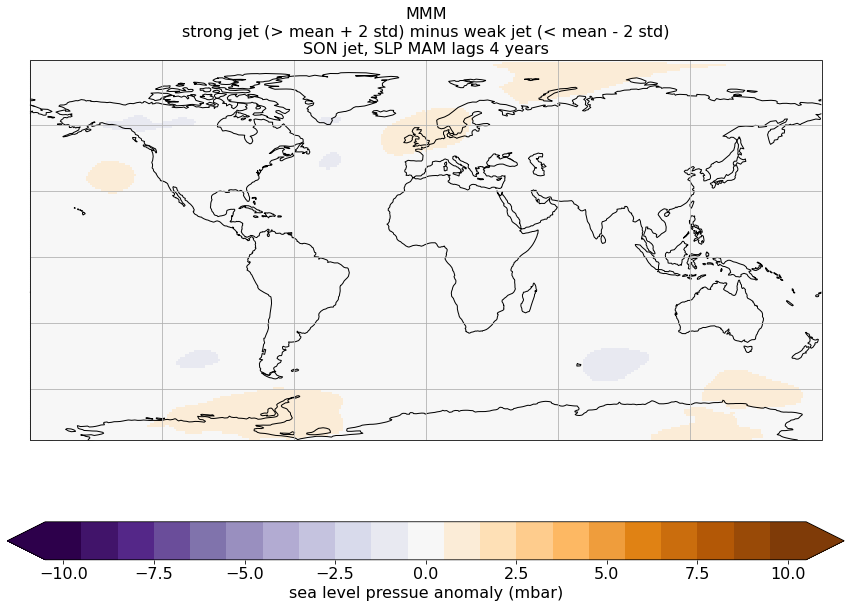

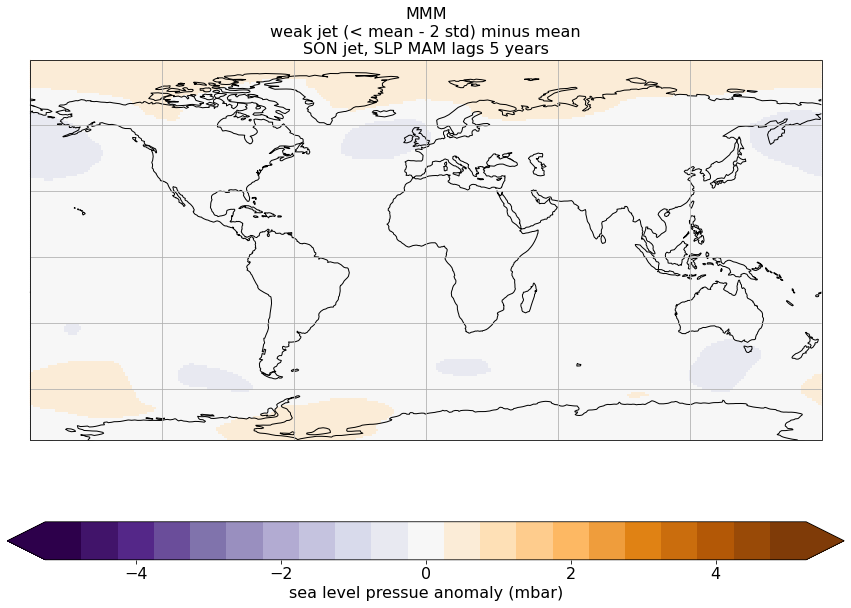

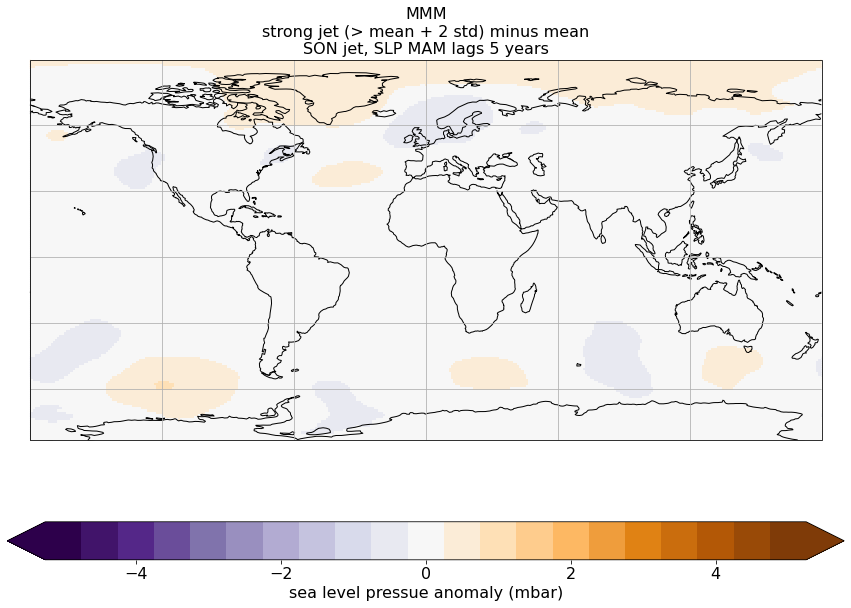

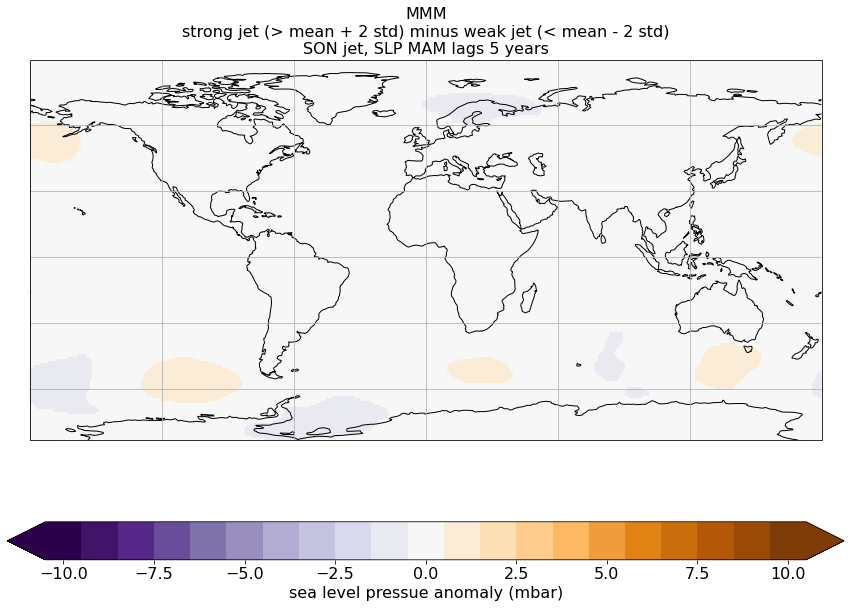

In [8]:
# Loop through each model and plot figures and save MMM:

if var_ts == 'max_lats':
    lmin  = 'southernly jet (< mean - 2 std)'
    lmax  = 'northernly jet (> mean + 2 std)'
elif var_ts == 'max_wind':
    lmin  = 'weak jet (< mean - 2 std)'
    lmax  = 'strong jet (> mean + 2 std)'

mean_MMM = np.zeros((np.size(lat),np.size(lon)),'float')
min2_MMM = np.zeros((nl,np.size(lat),np.size(lon)),'float')
max2_MMM = np.zeros((nl,np.size(lat),np.size(lon)),'float')

cc = 0
for mm in range(0,nm):
    print(models[mm])
    model = models[mm].split('_')[0]
    ENS   = models[mm].split('_')[1]
    
    ncid      = Dataset(infile,'r')
    data_mean = ncid.variables['mean'][mm,:,:]
    data_min2 = ncid.variables['min_std2'][mm,:,:,:]
    data_max2 = ncid.variables['max_std2'][mm,:,:,:]
    ncid.close()

    if models[mm] in s2_models:  # Models with too few years
        print(models[mm] + ' has no fields')
        tcol = 'C0'
    elif models[mm] in p_models:
        print('problem ' + models[mm])
        tcol = 'C3'
    else:
        tcol = 'k'
        cc = cc + 1
        mean_MMM = mean_MMM + data_mean
        min2_MMM = min2_MMM + data_min2
        max2_MMM = max2_MMM + data_max2
    # Plot individual models:
    for ll in range(0,nl):
        if lags[ll] == plot_lag:
            plot_globaly(data_min2[ll,:,:]-data_mean,
                         (model + ' ' + ENS + '\n' + lmin + ' minus mean\n' + season_ts +
                         ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),tcol,
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_min-mean_2std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

            plot_globaly(data_max2[ll,:,:]-data_mean,
                         (model + ' ' + ENS + '\n' + lmax + ' minus mean\n' + season_ts +
                         ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),tcol,
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_max-mean_2std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

            plot_globaly(data_max2[ll,:,:]-data_min2[ll,:,:],
                         (model + ' ' + ENS + '\n' + lmax + ' minus ' + lmin + ' \n' + season_ts +
                         ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),tcol,
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_max-min_2std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)
        
mean_MMM = mean_MMM/cc
min2_MMM = min2_MMM/cc
max2_MMM = max2_MMM/cc   
print(cc)

# Plot multi-model mean:
for ll in range(0,nl):        
    plot_globaly(min2_MMM[ll,:,:]-mean_MMM,('MMM\n' + lmin + ' minus mean\n' + season_ts +
        ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),'k',(figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
        '-' + season_field + '_min-mean_2std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max2_MMM[ll,:,:]-mean_MMM,('MMM\n' + lmax + ' minus mean\n' + season_ts +
                 ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),'k',(figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_max-mean_2std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max2_MMM[ll,:,:]-min2_MMM[ll,:,:],('MMM\n' + lmax + ' minus ' + lmin + '\n' + season_ts +
                 ' jet, SLP ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),'k',(figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                  '-' + season_field + '_max-min_2std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)

In [9]:
list(models[:])

['ACCESS-CM2_r1i1p1f1',
 'ACCESS-ESM1-5_r1i1p1f1',
 'BCC-CSM2-MR_r1i1p1f1',
 'BCC-ESM1_r1i1p1f1',
 'CAMS-CSM1-0_r1i1p1f1',
 'CAS-ESM2-0_r1i1p1f1',
 'CESM2_r1i1p1f1',
 'CESM2-FV2_r1i1p1f1',
 'CESM2-WACCM_r1i1p1f1',
 'CESM2-WACCM-FV2_r1i1p1f1',
 'CMCC-CM2-SR5_r1i1p1f1',
 'CanESM5_r1i1p1f1',
 'CanESM5_r1i1p2f1',
 'CanESM5-CanOE_r1i1p2f1',
 'FGOALS-g3_r1i1p1f1',
 'FIO-ESM-2-0_r1i1p1f1',
 'GISS-E2-1-G_r1i1p1f1',
 'GISS-E2-1-G-CC_r1i1p1f1',
 'GISS-E2-1-H_r1i1p1f1',
 'GISS-E2-2-G_r1i1p1f1',
 'HadGEM3-GC31-LL_r1i1p1f1',
 'HadGEM3-GC31-MM_r1i1p1f1',
 'IITM-ESM_r1i1p1f1',
 'MIROC-ES2L_r1i1p1f2',
 'MIROC6_r1i1p1f1',
 'MPI-ESM-1-2-HAM_r1i1p1f1',
 'MPI-ESM1-2-HR_r1i1p1f1',
 'MPI-ESM1-2-LR_r1i1p1f1',
 'MRI-ESM2-0_r1i1p1f1',
 'NESM3_r1i1p1f1',
 'NorCPM1_r1i1p1f1',
 'NorESM1-F_r1i1p1f1',
 'NorESM2-MM_r1i1p1f1',
 'SAM0-UNICON_r1i1p1f1',
 'TaiESM1_r1i1p1f1',
 'UKESM1-0-LL_r1i1p1f2']

In [10]:
len(models)

36